In [1]:
#%%
import torch
import clip
from PIL import Image

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)



/home/nao/anaconda3/envs/clip/lib/python3.7/site-packages/clip/clip.py:23: UserWarning: PyTorch version 1.7.1 or higher is recommended
  warnings.warn("PyTorch version 1.7.1 or higher is recommended")


In [2]:
# %%
from sklearn.metrics.pairwise import cosine_distances
import numpy as np

#%% CLIP TEST

image = preprocess(Image.open("./surfer.jpeg")).unsqueeze(0).to(device)
text = clip.tokenize(["image of a surfer", "a car in fire", "a cat"]).to(device)

with torch.no_grad():
    image_features = model.encode_image(image)
    print(image_features.norm(dim=1, keepdim=True))

    image_features = model.encode_image(image).cpu().numpy()
    print(np.linalg.norm(image_features, axis=1, keepdims=True))

    text_features = model.encode_text(text).cpu().numpy()
    
    sims = cosine_distances(image_features, text_features)
    print(sims)
    
    logits_per_image, logits_per_text = model(image, text)
    probs = logits_per_image.softmax(dim=-1).cpu().numpy()

print("Label probs:", probs)  # prints: [[0.9927937  0.00421068 0.00299572]]

# candidate RN101 ViT model??

tensor([[10.2500]], device='cuda:0', dtype=torch.float16)
[[10.25]]
[[0.68271088 0.85141048 0.83340323]]
Label probs: [[1.e+00 6.e-08 3.e-07]]


In [3]:
clip.available_models()

['RN50', 'RN101', 'RN50x4', 'RN50x16', 'ViT-B/32', 'ViT-B/16']

In [4]:
import pandas as pd

# download CGG-training.tsv here: https://ai.google.com/research/ConceptualCaptions/download
df = pd.read_table("./datasets/GCC-training.tsv")

/home/nao/anaconda3/envs/clip/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: read_table is deprecated, use read_csv instead, passing sep='\t'.
  This is separate from the ipykernel package so we can avoid doing imports until


In [5]:
from joblib import Parallel, delayed

def get_text_embeds(org_text):
    texts = []
    for t in org_text:
        texts.append(t[:77]) # limit length <- limitation of the CLIP model
    
    with torch.no_grad():
        text = clip.tokenize(texts).to(device)
        text_features = model.encode_text(text).cpu().numpy()
    return text_features, org_text

# parallel processing    
output = Parallel(n_jobs=4)(delayed(get_text_embeds[:100])(row[0]) for index, row in df.iterrows())

In [ ]:
# embeds = []
# text_list = []
# for i in range(0, df.values.shape[0], 1000):
#     embs, texts = get_text_embeds(list(df.values[i:i+1000,0]))
#     embeds.append(embs)
#     text_list.extend(texts)

In [ ]:
import numpy as np
text_embeds = np.vstack(embeds)
print(text_embeds.shape)
text_list = np.array(text_list)

np.savez("./tmp/text_caption.npz", embed=text_embeds, texts=np.array(text_list))

In [6]:
text_embeds = np.load("./tmp/text_caption.npz")['embed']
texts_list = np.load("./tmp/text_caption.npz")['texts']


In [ ]:
# %%
import librosa 
from tqdm import tqdm
from glob import glob
filepaths = glob("../../Datasets/Audio/Freesound/Freesound_caption/development/*.wav")

#%%
import warnings
warnings.filterwarnings('ignore')

#%%
import soundfile as sf

embeds = []

def get_embeds(path):
    try:
        y, sr = librosa.load(path, sr=16000, mono=True)
#    y, sr = sf.read(path, samplerate=16000, channels=1)
        e = wav2clip.embed_audio(y, w2c_model)
        return (e, path)
    except:
        return None
#%%

from joblib import Parallel, delayed
from math import sqrt

out = Parallel(n_jobs=-1)(delayed(get_embeds)(path) for path in filepaths)

# %%
embeds_ = [ a[0] for a in out if a is not None]
filepaths_ = [ a[1] for a in out if a is not None]
# %%
import numpy as np
embeds_ = np.squeeze(np.array(embeds_))
filepaths_ = np.array(filepaths_)
np.savez("./tmp/freesound_caption.npz", embed=embeds_, filepaths=filepaths_)


In [ ]:

# %% GET EMBEDDINGS
import wav2clip
w2c_model = wav2clip.get_model()


# %%
import librosa 

y, sr = librosa.core.load("../../Datasets/Audio/ImaginarySoundscape_sound/123021_367313_0.mp3", sr=16000, mono=True)
embeddings = wav2clip.embed_audio(y, w2c_model)
print(embeddings.shape)
# %%
from tqdm import tqdm
from glob import glob
filepaths = glob("../../Datasets/Audio/ImaginarySoundscape_sound/*.mp3")

#%%
import warnings
warnings.filterwarnings('ignore')

#%%
import soundfile as sf

embeds = []

def get_embeds(path):
    try:
        y, sr = librosa.load(path, sr=16000, mono=True)
#    y, sr = sf.read(path, samplerate=16000, channels=1)
        e = wav2clip.embed_audio(y, w2c_model)
        return (e, path)
    except:
        return None
#%%

from joblib import Parallel, delayed
from math import sqrt

out = Parallel(n_jobs=-1)(delayed(get_embeds)(path) for path in filepaths)

# %%
embeds_ = [ a[0] for a in out if a is not None]
filepaths_ = [ a[1] for a in out if a is not None]
# %%
import numpy as np
embeds_ = np.squeeze(np.array(embeds_))
filepaths_ = np.array(filepaths_)
np.savez("./tmp/imaginarysoundscape_audio_embeds.npz", embed=embeds_, filepaths=filepaths_)

In [ ]:

# %% GET EMBEDDINGS
import wav2clip
import librosa 

w2c_model = wav2clip.get_model()

# %%
from tqdm import tqdm
from glob import glob
filepaths = glob("../../Datasets/Audio/youtube-5m/*/*.wav")

#%%
import warnings
warnings.filterwarnings('ignore')

#%%
import soundfile as sf

embeds = []

def get_embeds(path):
    try:
        y, sr = librosa.load(path, sr=16000, mono=True)
#    y, sr = sf.read(path, samplerate=16000, channels=1)
        e = wav2clip.embed_audio(y, w2c_model)
        return (e, path)
    except:
        return None
#%%

from joblib import Parallel, delayed
from math import sqrt

out = Parallel(n_jobs=-1)(delayed(get_embeds)(path) for path in filepaths)

# %%
embeds_ = [ a[0] for a in out if a is not None]
filepaths_ = [ a[1] for a in out if a is not None]
# %%
import numpy as np
embeds_ = np.squeeze(np.array(embeds_))
filepaths_ = np.array(filepaths_)
np.savez("./tmp/youtube5m_audio_embeds.npz", embed=embeds_, filepaths=filepaths_)

In [7]:
import numpy as np
audio_embeds = np.load("./tmp/imaginarysoundscape_audio_embeds.npz")['embed']
audio_filepaths = np.load("./tmp/imaginarysoundscape_audio_embeds.npz")['filepaths']

In [ ]:
import numpy as np
audio_embeds = np.load("./tmp/youtube5m_audio_embeds.npz")['embed']
audio_filepaths = np.load("./tmp/youtube5m_audio_embeds.npz")['filepaths']

In [15]:
# %%
from sklearn.metrics.pairwise import cosine_distances
from sklearn.metrics.pairwise import euclidean_distances


def get_best_fit_text_to_image(img_path, embeds, texts, topK=1, normalized=True):
    image = preprocess(Image.open(img_path)).unsqueeze(0).to(device)
    with torch.no_grad():
        image_features = model.encode_image(image).cpu().numpy()
    
    if normalized:
        image_features /= np.linalg.norm(image_features, axis=1, keepdims=True)
        embeds /= np.linalg.norm(embeds, axis=1, keepdims=True)
    dist = np.dot(image_features, embeds.T).squeeze()
    index = np.argsort(dist * -1, axis=0).squeeze()[:topK]
    return texts[index]

def get_best_fit_audio_to_text(input_txt, embeds, paths, topK=1, normalized=True):
    print(input_txt)
    text = clip.tokenize([input_txt]).to(device)
    with torch.no_grad():
        text_features = model.encode_text(text).cpu().numpy()

    if normalized:
        text_features /= np.linalg.norm(text_features, axis=1, keepdims=True)
        embeds /= np.linalg.norm(embeds, axis=1, keepdims=True)
    
    sims = np.dot(text_features, embeds.T).squeeze()
    index = np.argsort(sims * -1, axis=0).squeeze()[:topK]
    return paths[index]

def get_best_fit_audio_to_image(img_path, embeds, paths, topK=1, normalized=True):
    image = preprocess(Image.open(img_path)).unsqueeze(0).to(device)
    with torch.no_grad():
        image_features = model.encode_image(image).cpu().numpy()
        
    if normalized:
        image_features /= np.linalg.norm(image_features, axis=1, keepdims=True)
        embeds /= np.linalg.norm(embeds, axis=1, keepdims=True)
    
    dist = np.dot(image_features, embeds.T).squeeze()
    index = np.argsort(dist * -1, axis=0).squeeze()[:topK]
    return paths[index]


In [ ]:
import IPython.display as ipd

img_path = "./images/nezuko.jpeg"
ipd.display(Image.open(img_path))

output_text = get_best_fit_text_to_image(img_path, text_embeds, texts_list, 10, normalized=True)
print(output_text)

output_text = get_best_fit_text_to_image(img_path, text_embeds, texts_list, 10, normalized=False)
print(output_text)

In [ ]:
import IPython.display as ipd

img_path = "./images/nezuko.jpeg"

ipd.display(Image.open(img_path))

output_paths = get_best_fit_text_to_image(img_path, audio_embeds, audio_filepaths, 10, cosine_distances)

for path in output_paths:
    ipd.display(ipd.Audio(path))

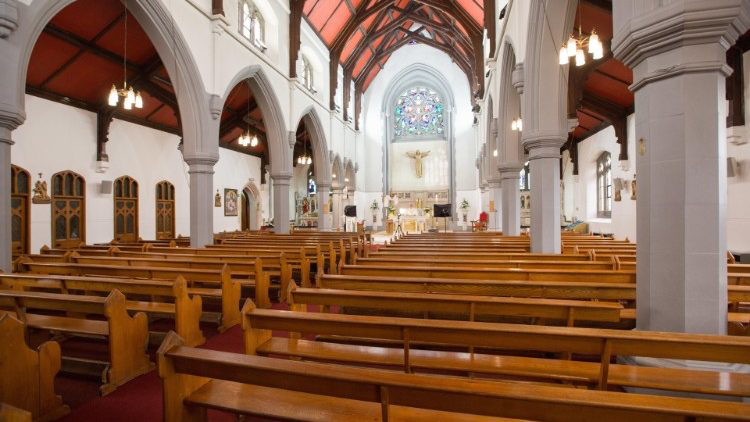

---- not normalized


In [25]:
import IPython.display as ipd

img_path = "./images/church.jpeg"
ipd.display(Image.open(img_path))

output_paths = get_best_fit_audio_to_image(img_path, audio_embeds, audio_filepaths, 10, normalized=True)

for path in output_paths:
    ipd.display(ipd.Audio(path))

print("---- not normalized")
output_paths = get_best_fit_audio_to_image(img_path, audio_embeds, audio_filepaths, 10, normalized=False)

for path in output_paths:
    ipd.display(ipd.Audio(path))

In [28]:
import IPython.display as ipd

input_txt = "image of a beach"
output_paths = get_best_fit_audio_to_text(input_txt, audio_embeds, audio_filepaths, 10,  normalized=True)

for path in output_paths:
    ipd.display(ipd.Audio(path))

output_paths = get_best_fit_audio_to_text(input_txt, audio_embeds, audio_filepaths, 10,  normalized=False)
for path in output_paths:
    ipd.display(ipd.Audio(path))


image of a beach


image of a beach


In [ ]:
print(embeds_)